In [57]:
%matplotlib inline
import math
import os 
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as cl
import matplotlib.ticker as mtick
from matplotlib.gridspec import GridSpec
import statsmodels.api as sm
from pandas import ExcelWriter
import pickle
import scipy as sp
import re

In [59]:
def load_object(filename):
    with open(filename, 'rb') as fid:
        file = pickle.load(fid)
    return file

def index(data, label):
    mini = data.reset_index()[data.reset_index()['labels'] == label].index.min()
    maxi = data.reset_index()[data.reset_index()['labels'] == label].index.max()
    return [mini,maxi]

def non_zero_data(data):
    #data = data.drop(columns = "ID")
    non_zero_rows = data.abs().sum(axis=1) > 0.0
    non_zero_data = data[non_zero_rows]
    #non_zero_columns = non_zero_data.abs().sum(axis=0) > 0.0
    #non_zero_data = non_zero_data.loc[: , non_zero_columns]
    return non_zero_data

#put multiple DFs together with the key
def combineddf(dflist, dfkeys, ELEMENTS, noise = None, coefficient = None,):
    #make an empty list
    combinedlist = []
    #make an empty dataframe
    combineddf12 = pd.DataFrame()

    for i,j in zip(dflist, dfkeys):
        if noise == None and coefficient == None:
            df = non_zero_data(i[ELEMENTS])
            #fillnan with 0
            df[np.isnan(df)] = 0
        else:
            #add noise
            df = addnoise(i[ELEMENTS], noise, coefficient)


        df['labels'] = j
        combinedlist.append(df)
        combineddf12 = pd.concat([combineddf12, df])
    return combineddf12

#Counts total number of peaks for each isotope
def marginal_particle(data):
    #replace 0 with nan
    data.replace(0, np.nan, inplace = True)
    return abs(data).count().sort_values(ascending=False)

ELEMENTS = ['48Ti', '51V', '53Cr', '55Mn', '54Fe', '59Co', '60Ni', '63Cu', '64Zn', '69Ga', '72Ge', '75As', '78Se', '85Rb', '88Sr', '89Y', '90Zr', '93Nb', 
           '98Mo', '108Pd', '107Ag', '114Cd', '120Sn', '121Sb', '133Cs', '138Ba', '139La', '140Ce', '152Sm', '153Eu', '158Gd', '159Tb', '164Dy', '165Ho',
           '166Er', '169Tm', '174Yb', '175Lu', '180Hf', '185Re', '192Os', '193Ir', '195Pt', '197Au', '202Hg', '208Pb', '238U']

In [60]:

#returns aggregate particles of a dataset
def aggregate_particles(data, element1 = None):
    total = []
    #go through each row
    for i in data.itertuples():
        labels = []
        #in that row, go through each element
        for j in range(1, len(i)):
            #if there is some value
            if i[j] > 0:
                #append the element into the labels list
                labels.append(data.columns[j - 1])
                #if there is no elements
                if labels[-1] == None:
                    print('ERROR')
        #if there are some elements in the labels list
        if labels != []:
            #append it to the total list
            total.append(labels)
    #make an array of this
    total = np.array(total)
    #only find the unique labels
    uniquelist = np.unique(total)
    
    
    #if element1 is there, focus on that one element
    if element1 != None:
        uniquelist = uniquelist[[element1 in i for i in uniquelist]]
        
    uniquelist1 = []
    #for each unique label
    for i in uniquelist:
        #join them together with a + sign
        uniquelist1.append('+'.join(i))
    totalvalue = []
    # for each unique label
    for i in uniquelist:
        value = 0
        # for each label in total
        for j in total:
            if i == j:
                #count how many there are
                value = value + 1
        totalvalue.append(value)

    finaldf = pd.DataFrame(totalvalue, uniquelist1, columns = ['Value']).sort_values('Value', ascending = False)
    return finaldf

    #returns aggregate particles of a dataset
def aggregate_particles_mod(data):
    total = []
    #go through each row
    for i in data.itertuples():
        labels = []
        #in that row, go through each element
        for j in range(1, len(i)):
            #if there is some value
            if i[j] > 0:
                #append the element into the labels list
                labels.append(data.columns[j - 1])
                #if there is no elements
                if labels[-1] == None:
                    print('ERROR')
        #if there are some elements in the labels list
        if labels != []:
            #append it to the total list
            total.append('+'.join(labels))
    #make an array of this
    total = np.array(total)
    #only find the unique labels
    uniquelist = np.unique(total)
    return total

#returns aggregate particles of a dataset
def aggregate_particles_specific(data, element1 = None):
    total = []
    #go through each row
    for i in data.itertuples():
        labels = []
        #in that row, go through each element
        for j in range(1, len(i)):
            #if there is some value
            if i[j] > 0:
                #append the element into the labels list
                labels.append(data.columns[j - 1])
                #if there is no elements
                if labels[-1] == None:
                    print('ERROR')
        #if there are some elements in the labels list
        if labels != []:
            #append it to the total list
            total.append(labels)
    #make an array of this
    total = np.array(total)
    #only find the unique labels
    uniquelist = np.unique(total)
    
    
    #if element1 is there, focus on that one element
    if element1 != None:
        uniquelist = uniquelist[[element1 in i for i in uniquelist]]
        
    uniquelist1 = []
    #for each unique label
    for i in uniquelist:
        #join them together with a + sign
        uniquelist1.append('+'.join(i))
    totalvalue = []
    # for each unique label
    for i in uniquelist:
        value = 0
        # for each label in total
        for j in total:
            if i == j:
                #count how many there are
                value = value + 1
        totalvalue.append(value)

    finaldf = pd.DataFrame(totalvalue, uniquelist1, columns = ['Value']).sort_values('Value', ascending = False).reset_index()
    return finaldf, total

#Type: Data Frame. From a selected isotope and its particle events, select all other isotopes associated and drop others not associated with it
def isotope_particle(data, isotope):
    obs = data[data[isotope]>0.0]
    return obs

In [61]:
#load the codes
Qian2016codes = load_object('models/multipleLDAmodels/Qian2016codes_5.pkl')
Qian2018codes = load_object('models/multipleLDAmodels/Qian2018codes_5.pkl')
QianU2019codes = load_object('models/multipleLDAmodels/QianU2019codes_5.pkl')
QianR2019codes = load_object('models/multipleLDAmodels/QianR2019codes_5.pkl')
Sourcetrainingcodes = load_object('models/multipleLDAmodels/Sourcesamples_trainingcodes_5.pkl')
Sourcetestingcodes = load_object('models/multipleLDAmodels/Sourcesamples_testingcodes_5.pkl')

Qian2016, Qian2016keys = load_object('models/multipleLDAmodels/Qian2016DF_5.pkl')
Qian2018, Qian2018keys = load_object('models/multipleLDAmodels/Qian2018DF_5.pkl')
QianU2019, QianU2019keys = load_object('models/multipleLDAmodels/QianU2019DF_5.pkl')
QianR2019, QianR2019keys = load_object('models/multipleLDAmodels/QianR2019DF_5.pkl')
Sourcetraining, Sourcekeys = load_object('models/multipleLDAmodels/SourcetrainingDF_5.pkl')
Sourcetesting, Sourcekeys = load_object('models/multipleLDAmodels/SourcetestingDF_5.pkl')

#load mapping feature
m = load_object('models/multipleLDAmodels/randommappingfeature.pkl')

# choose the best model and apply on samples

In [62]:
model2 = load_object('models/multipleLDAmodels/LDAModel_5.pkl')

In [64]:
model2 = model2.fit(Sourcetrainingcodes)

Qian2016prob = model2.transform(Qian2016codes)
maxprob = Qian2016prob.max(axis = 1)
clustermax = Qian2016prob.argmax(axis = 1)

Sourceprob = model2.transform(Sourcetrainingcodes)
Sourcemaxprob = Sourceprob.max(axis = 1)
Sourceclustermax = Sourceprob.argmax(axis = 1)

Sourcetestingprob = model2.transform(Sourcetestingcodes)
Sourcetestingmaxprob = Sourcetestingprob.max(axis = 1)
Sourcetestingclustermax = Sourcetestingprob.argmax(axis = 1)

In [63]:
#save object
def save_object(obj, filename):
    with open(filename, 'wb') as output:  # Overwrites any existing file.
        pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)

# combine dataframe

In [65]:
Sourcetesting['elements'] = aggregate_particles_mod(Sourcetesting[ELEMENTS])
Sourcetraining['elements'] = aggregate_particles_mod(Sourcetraining[ELEMENTS])

# Get the unique matrix for the cluster for each source

In [66]:
import math
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier


In [67]:
def sourceclustermax_edit(sampledf,  sourcedf, percentage, ELEMENTS):

    totaldf = pd.DataFrame()
    y_scoredf = pd.DataFrame()
    Binarytestlabelsdf = pd.DataFrame()

    train = sourcedf
    test = sampledf

    #get the elements column in dataframe
    for particle in test['elements'].unique():
        trainingdf = train[train['elements'] == particle]
        testingdf = test[test['elements'] == particle]
        model = KNeighborsClassifier(n_neighbors = int(math.ceil(percentage*len(trainingdf))), weights = 'distance')
        Binarymodel = OneVsRestClassifier(model)
        try:
            model.fit(trainingdf[ELEMENTS], trainingdf['labels'])
            testingdf.loc[:,'Probable Source'] = model.predict(testingdf[ELEMENTS])
            testingdf.loc[:,'Confidence'] = model.predict_proba(testingdf[ELEMENTS]).max()

            BinaryTrainlabels = label_binarize(trainingdf['labels'], classes = Sourcekeys)
            BinaryTestlabels = label_binarize(testingdf['labels'], classes = Sourcekeys)
            Binarymodel.fit(trainingdf[ELEMENTS], BinaryTrainlabels)
            

            y_score = Binarymodel.predict_proba(testingdf[ELEMENTS])
            Binarytestlabelsdf = pd.concat([Binarytestlabelsdf, pd.DataFrame(BinaryTestlabels)])
            y_scoredf = pd.concat([y_scoredf, pd.DataFrame(y_score)])
        except:
            testingdf.loc[:,'Probable Source'] = 'Uncertain'

        totaldf = pd.concat([totaldf, testingdf])
        

    return totaldf, y_scoredf, Binarytestlabelsdf

In [68]:
Sourcetestingtotaldf, yscoredftest, Btest1 = sourceclustermax_edit(Sourcetesting, Sourcetraining, 0.2,  ELEMENTS)
Sourcetrainingtotaldf, scoredftrain, Btrain1 = sourceclustermax_edit(Sourcetraining, Sourcetraining, 0.2, ELEMENTS)

c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

## Get Metrics

In [70]:
#testing error
len(Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == Sourcetestingtotaldf['Probable Source']])/len(Sourcetestingtotaldf)

0.64668911335578

In [71]:
#training error
len(Sourcetrainingtotaldf[Sourcetrainingtotaldf['labels'] == Sourcetrainingtotaldf['Probable Source']])/len(Sourcetrainingtotaldf)

1.0

In [73]:
def percSource(totaldf, samplekeys):
    Sourceallocation = []
    for key in samplekeys:
        alloc = np.unique(totaldf[totaldf['labels'] == key]['Probable Source'], return_counts = True)
        perc = alloc[1]/alloc[1].sum()
        Sourceallocation.append([alloc[0], perc, alloc[1]])
    return Sourceallocation

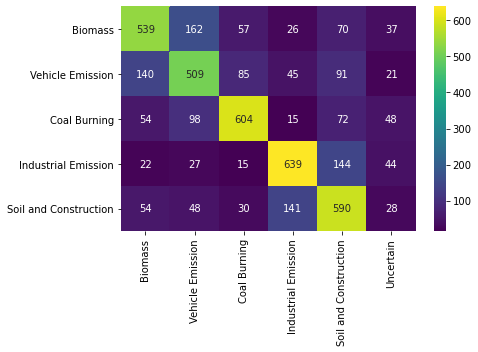

In [74]:
Sourceallocationdf = pd.DataFrame()
for i in percSource(Sourcetestingtotaldf, Sourcekeys):
    Sourceallocationdf = pd.concat([Sourceallocationdf,  pd.DataFrame(i[2], index = i[0])], axis = 1)
Sourceallocationdf.columns = Sourcekeys

#Sourceallocationdf
cols = Sourceallocationdf.columns.tolist()
cols = ['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction']
Sourceallocationdf = Sourceallocationdf[cols]

ax, fig = plt.subplots(figsize = (7, 5))
ax = sns.heatmap(Sourceallocationdf.T[['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction', 'Uncertain']], annot = True, fmt="d", cmap = 'viridis')
plt.tight_layout()
plt.savefig('Figures/confusionmatrixsemisupervisedmethodtest.png', dpi = 600)

In [75]:
confusionmatrixnorm = Sourceallocationdf.T[['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction', 'Uncertain']]/Sourceallocationdf.T[['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction', 'Uncertain']].sum(axis = 0)

In [76]:
# Create a column if it is wrong or right
Sourcetestingtotaldf.reset_index(drop = True, inplace = True)
column = []
for ID, particle in enumerate(Sourcetestingtotaldf['labels']):
    if particle != Sourcetestingtotaldf['Probable Source'][ID]:
        column.append(0)
    else:
        column.append(1)

Sourcetestingtotaldf['Correct?'] = pd.Series(column)

## Unique Fingerprint profile

In [77]:
#Change this so it is just the element particle types getting correct, regardless of labels

dfcorrect = pd.DataFrame()
for source in Sourcekeys:
    #parse to the source
    df = Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == source]
    for element in df['elements'].unique():
    #parse to the particle type
        df1 = df[df['elements'] == element]
    #how many did it get correct
        percentcorrect = len(df1[df1['Probable Source'] == source])/len(df1)
        dfcorrect = pd.concat([dfcorrect, pd.Series([source,element,percentcorrect, len(df1)])], axis = 1)

dfparticlenumber = dfcorrect.T.pivot(index = 0, columns = 1, values = 3)
dfcorrectpercentage = dfcorrect.T.pivot(index = 0, columns = 1, values = 2)
dfcorrectparticlenumber = dfparticlenumber*dfcorrectpercentage

particletypecorrect = []
for j in dfcorrectpercentage.index:
    for k in dfcorrectpercentage.columns:
        if dfcorrectpercentage.loc[j,k] >= 0.9:
            particletypecorrect.append([j,k, dfcorrectparticlenumber.loc[j,k]])

from pandas import ExcelWriter

def save_xls(list_dfs, xls_path):
    with ExcelWriter(xls_path) as writer:
        for n, df in enumerate(list_dfs):
            df.to_excel(writer,'sheet%s' % n)
        writer.save()

df = pd.DataFrame(particletypecorrect).pivot(columns = 0, values = 1)
compiledparticletypelist = df.apply(lambda x: pd.Series(x.dropna().values))

df = pd.DataFrame(particletypecorrect).pivot(columns = 0, values = 2)
compiledparticlenumberlist = df.apply(lambda x: pd.Series(x.dropna().values))

save_xls([compiledparticletypelist, compiledparticlenumberlist], 'outputdata/particletypecorrect.xlsx')


c:\Users\garre\anaconda3\lib\site-packages\xlsxwriter\workbook.py:336: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


In [20]:
#Change this so it is just the element particle types getting correct, regardless of labels

dfcorrect = pd.DataFrame()
for element in Sourcetestingtotaldf['elements'].unique():
#parse to the particle type
    df1 = Sourcetestingtotaldf[Sourcetestingtotaldf['elements'] == element]
#how many did it get correct
    percentcorrect = len(df1[df1['Correct?'] == 1])/len(df1)
    dfcorrect = pd.concat([ dfcorrect, pd.Series([element,percentcorrect, len(df1), df1['labels'].values[0]])], axis = 1)

dfparticlenumber = dfcorrect.T.pivot(index = 3, columns = 0, values = 2)
dfcorrectpercentage = dfcorrect.T.pivot(index = 3, columns = 0, values = 1)
dfcorrectparticlenumber = dfparticlenumber*dfcorrectpercentage

particletypecorrect = []
particletypecorrect2 = []
for j in dfcorrectpercentage.index:
    for k in dfcorrectpercentage.columns:
        if dfcorrectpercentage.loc[j,k] >= 0.9:
            particletypecorrect.append([j,k, dfcorrectparticlenumber.loc[j,k]])
            particletypecorrect2.append([j,k, dfcorrectpercentage.loc[j,k]])

df = pd.DataFrame(particletypecorrect).pivot(index = 0, columns = 1, values = 2)
df1 = pd.DataFrame(particletypecorrect).pivot(index = 1, columns = 0, values = 2)
df1.to_csv('outputdata/particletypecorrectnumber.csv')
df = pd.DataFrame(particletypecorrect2).pivot(index = 0, columns = 1, values = 2)
df2 = pd.DataFrame(particletypecorrect2).pivot(index = 1, columns = 0, values = 2)
df2.to_csv('outputdata/particletypecorrectpercentage.csv')

In [21]:
appendthekey = []
for source in df2.columns:
    series = df2[source].isna() == False
    something = df2.loc[df2.index[series]].index
    appendthekey.append(something)

keydf = pd.DataFrame(appendthekey).T
keydf.columns = df2.columns
keydf.to_csv('outputdata/keydf.csv')

In [22]:
#The particle types we need to predict
predictparticletype = np.array(particletypecorrect)[:, 1]

## Applying to pm2.5 samples

In [23]:
Sourcekeys = ['Soil and Construction', 'Coal Burning', 'Industrial Emission', 'Vehicle Emission', 'Biomass']
Predictedkeys = ['Soil and Construction', 'Coal Burning', 'Industrial Emission', 'Vehicle Emission', 'Biomass', 'Uncertain']
Qian2016['elements'] = aggregate_particles_mod(Qian2016[ELEMENTS])
Qian2018['elements'] = aggregate_particles_mod(Qian2018[ELEMENTS])
QianU2019['elements'] = aggregate_particles_mod(QianU2019[ELEMENTS])
QianR2019['elements'] = aggregate_particles_mod(QianR2019[ELEMENTS])

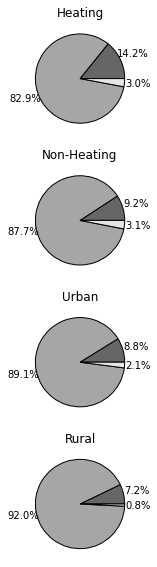

In [24]:
from cycler import cycler
import matplotlib.gridspec as gridspec
colors = plt.cm.gray(np.linspace(0.4,0.9,3))

gs = gridspec.GridSpec(4, 1)
plt.figure(figsize = (2, 10))
plt.rcParams['axes.prop_cycle'] = cycler(color=colors)
labels = ['Heating', 'Non-Heating', 'Urban', 'Rural']
#Get the percentage of particles that can be predicted:
for ID, sample in enumerate([Qian2016, Qian2018, QianU2019, QianR2019]):
    #print(labels[ID], len(sample[sample['elements'].isin(predictparticletype)])/len(sample))

    percentvalue = len(sample[sample['elements'].isin(predictparticletype)])/len(sample)
    totalpercentintraining = len(sample[sample['elements'].isin(Sourcetrainingtotaldf['elements'])])/len(sample)
    notpercentvalue = 1- totalpercentintraining
    arraypie = [percentvalue ,  1-percentvalue-notpercentvalue, notpercentvalue]
    ax = plt.subplot(gs[ID, 0])
    wedges = ax.pie(arraypie, autopct='%1.1f%%', pctdistance = 1.3)
    for w in wedges[0]:
        w.set_edgecolor('black')
    ax.set_title(labels[ID])
plt.savefig('Figures/samples.png', dpi = 900)
    

In [25]:
Sourcekeys = ['Soil and Construction', 'Coal Burning', 'Industrial Emission', 'Vehicle Emission', 'Biomass']

In [26]:
Sourcetestingdf = Sourcetestingtotaldf[Sourcetestingtotaldf['elements'].isin(predictparticletype)]

Particlescorrect = []
for source in Sourcekeys:
    Particlescorrect.append(len(Sourcetestingdf[Sourcetestingdf['Probable Source'].isin([source])]))

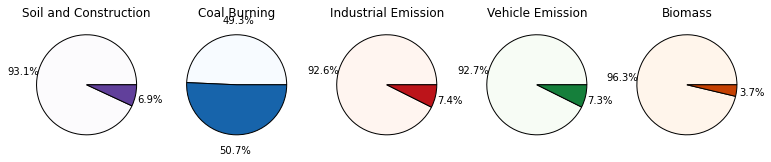

In [27]:
# Percent of particles that are unique and correctly identified.
gs = gridspec.GridSpec(1, 5)
plt.figure(figsize = (13, 4))
listofcolors = [plt.cm.Purples(np.linspace(0,0.8,2)), plt.cm.Blues(np.linspace(0,0.8,2)), plt.cm.Reds(np.linspace(0,0.8,2)), plt.cm.Greens(np.linspace(0,0.8,2)), plt.cm.Oranges(np.linspace(0,0.8,2))]
for ID, source in enumerate(Sourcekeys):
    plt.rcParams['axes.prop_cycle'] = cycler(color=listofcolors[ID])
    #print(len(Sourcetestingdf[Sourcetestingdf['Probable Source'] == source])/len(Sourcetestingtotaldf[Sourcetestingtotaldf['Probable Source'] == source]))
    percentvalue = len(Sourcetestingdf[Sourcetestingdf['Probable Source'] == source])/len(Sourcetestingtotaldf[Sourcetestingtotaldf['Probable Source'] == source])
    arraypie = [1-percentvalue, percentvalue]
    ax = plt.subplot(gs[0, ID])
    wedges = ax.pie(arraypie, autopct='%1.1f%%', pctdistance = 1.3, labeldistance = 1.6)
    for w in wedges[0]:
        w.set_edgecolor('black')
    ax.set_title(Sourcekeys[ID])
plt.savefig('Figures/standards.png', dpi = 900)
    

c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

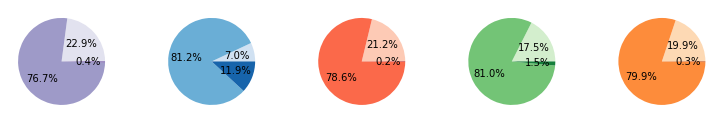

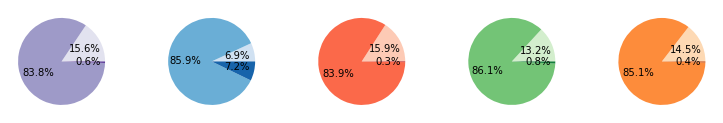

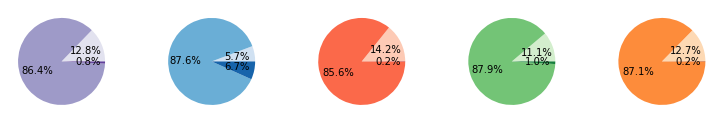

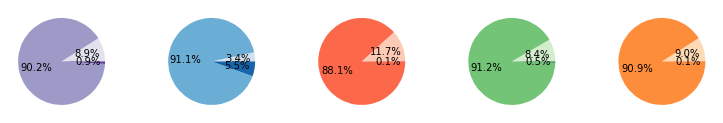

In [28]:
samplelabels = ['Heating', 'Non-Heating', 'Urban', 'Rural']
for label, sample in enumerate([Qian2016, Qian2018, QianU2019, QianR2019]):
    #focus on that dataframe
    #let's reset the index
    sample.reset_index(drop = True, inplace = True)
    samplefocus = sample[sample['elements'].isin(predictparticletype)]

    samplefocustotaldf, scoredfsample, Btrain1 = sourceclustermax_edit(samplefocus, Sourcetraining, 0.2, ELEMENTS)

    Particlescorrect = []
    for source in Sourcekeys:
        Particlescorrect.append(len(samplefocustotaldf[samplefocustotaldf['Probable Source'].isin([source])]))

    #get the rest of the dataframe
    samplerest = sample[~sample.index.isin(samplefocus.index)]

    Particlesuncertain = []
    #for each source, find the particles that are in that source. 
    for source in Sourcekeys:
        keydataframe = Sourcetrainingtotaldf[Sourcetrainingtotaldf['labels'] == source]
        uncertain = len(samplerest[samplerest['elements'].isin(keydataframe['elements'])])
        Particlesuncertain.append(uncertain)

    identified = np.array(Particlescorrect)/len(sample)
    uncertain = np.array(Particlesuncertain)/len(sample)
    Notthere = 1 - identified - uncertain

    gs = gridspec.GridSpec(1, 5)
    plt.figure(figsize = (13, 2))
    listofcolors = [plt.cm.Purples(np.linspace(0.2,0.8,3)), plt.cm.Blues(np.linspace(0.2,0.8,3)), plt.cm.Reds(np.linspace(0.2,0.8,3)), plt.cm.Greens(np.linspace(0.2,0.8,3)), plt.cm.Oranges(np.linspace(0.2,0.8,3))]
    for ID, sourcevalue in enumerate(Sourcekeys):
        plt.rcParams['axes.prop_cycle'] = cycler(color=listofcolors[ID])
        arraypie = [Notthere[ID], uncertain[ID], identified[ID]]
        ax = plt.subplot(gs[0, ID])
        ax.pie(arraypie, autopct='%1.1f%%')
    plt.savefig('Figures/heatingpie' + samplelabels[label] +  '.png', dpi = 900)

    
    

In [29]:
compiledparticletypedf = pd.DataFrame()
for key in Sourcekeys:
    particletypelist = compiledparticletypelist[key].unique()
    Qian2016.reset_index(drop = True, inplace = True)
    keydf = Qian2016[Qian2016['elements'].isin(particletypelist)]
    keydf['assignedsource'] = key
    compiledparticletypedf = pd.concat([compiledparticletypedf, keydf], axis = 0)

uncertaindf = Qian2016[~Qian2016.index.isin(compiledparticletypedf.index)]
uncertaindf['assignedsource'] = 'Uncertain'

compiledparticletypedf = pd.concat([compiledparticletypedf, uncertaindf], axis = 0)




<ipython-input-29-9a07f8b065e7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  keydf['assignedsource'] = key
<ipython-input-29-9a07f8b065e7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncertaindf['assignedsource'] = 'Uncertain'


In [30]:
compiledparticletypelist_unique = pd.DataFrame()
for column in compiledparticletypelist.columns:
    compiledparticletypelist_unique = pd.concat([compiledparticletypelist_unique, pd.DataFrame(compiledparticletypelist[column].values)], axis = 0)

In [31]:
#these are the elements
elementlist = compiledparticletypelist_unique.drop_duplicates()[0].values
Qian2016[Qian2016['elements'].isin(elementlist)]

,48Ti,53Cr,55Mn,54Fe,59Co,60Ni,63Cu,64Zn,69Ga,72Ge,...,195Pt,197Au,202Hg,208Pb,238U,51V,labels,clusters,clustersprob,elements
3,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,9.192819e-17,0.0,0.0,Q16_12_10,4,0.997112,208Pb
5,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,7.006772e-17,0.0,0.0,Q16_12_10,4,0.996215,208Pb
6,0.0,0.0,0.000000e+00,5.644131e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_10,2,0.986608,54Fe
9,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,5.782139e-17,0.0,0.0,Q16_12_10,4,0.999099,120Sn+208Pb
10,0.0,0.0,0.000000e+00,8.394695e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_10,2,0.990952,54Fe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44444,0.0,0.0,0.000000e+00,1.630219e-15,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_22,2,0.995318,54Fe
44445,0.0,0.0,0.000000e+00,5.673591e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_22,2,0.986677,54Fe
44446,0.0,0.0,1.385312e-16,9.565988e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_22,2,0.997331,55Mn+54Fe
44449,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,3.213960e-16,0.0,0.0,0.0,...,0.0,0.0,0.0,1.292517e-15,0.0,0.0,Q16_12_22,3,0.346752,63Cu+208Pb


In [32]:

Qian2016df = sourceclustermax_edit(Qian2016, Sourcetraining, 0.2,  ELEMENTS)[0]
Qian2016results = []
for source in Predictedkeys:
    Qian2016results.append([source, len(Qian2016df[Qian2016df['Probable Source'] == source])/len(Qian2016df),
    Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].median(), Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].std()])
df = pd.DataFrame(Qian2016results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df.set_index('labels', inplace = True)

Qian2018df = sourceclustermax_edit(Qian2018, Sourcetraining, 0.2,  ELEMENTS)[0]
Qian2018results = []
for source in Predictedkeys:
    Qian2018results.append([source, len(Qian2018df[Qian2018df['Probable Source'] == source])/len(Qian2018df),
    Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].median(), Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].std()])
df1 = pd.DataFrame(Qian2018results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df1.set_index('labels', inplace = True)

QianU2019df = sourceclustermax_edit(QianU2019, Sourcetraining, 0.2,  ELEMENTS)[0]
QianU2019results = []
for source in Predictedkeys:
    QianU2019results.append([source, len(QianU2019df[QianU2019df['Probable Source'] == source])/len(QianU2019df),
    QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].median(), QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].std()])
df2 = pd.DataFrame(QianU2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df2.set_index('labels', inplace = True)

QianR2019df = sourceclustermax_edit(QianR2019, Sourcetraining, 0.2,  ELEMENTS)[0]
QianR2019results = []
for source in Predictedkeys:
    QianR2019results.append([source, len(QianR2019df[QianR2019df['Probable Source'] == source])/len(QianR2019df),
    QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].median(), QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].std()])
df3 = pd.DataFrame(QianR2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df3.set_index('labels', inplace = True)

c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

In [33]:
#confusionmatrixnorm

def percsamplesourcemix(df, confusionmatrix, source1, source2):
    #let's create new wedges for the samples
    #Soil and Construction vs Industrial Emission
    #percentage of SC predicted as IE
    perc1source = confusionmatrix.loc[source1, source2]

    #percentage of IE predicted as SC
    perc2source = confusionmatrix.loc[source2, source1]

    #multiply percentage of particles predicted as SC to be IE
    percsource2sample = df.loc[source1, 'Percentage'] * perc2source

    #multiply percentage of particles predicted as IE to be SC
    percsource1sample = df.loc[source2, 'Percentage'] * perc1source

    #add these two together
    percsamplecombined = percsource2sample + percsource1sample

    return percsamplecombined, percsource2sample, percsource1sample

#create a function out of this

In [34]:
listofdfs = []
for df in [df, df1, df2, df3]:
    # Let's create the new percentages

    listofperc = df['Percentage']

    #listofperc['SC and IE'] = percsamplesourcemix(df, confusionmatrixnorm, 'Soil and Construction', 'Industrial Emission')[0]

    #remove percentage from each source
    #listofperc['Soil and Construction'] = listofperc['Soil and Construction'] - percsamplesourcemix(df, confusionmatrixnorm, 'Soil and Construction', 'Industrial Emission')[1]
    #listofperc['Industrial Emission'] = listofperc['Industrial Emission'] - percsamplesourcemix(df, confusionmatrixnorm, 'Soil and Construction', 'Industrial Emission')[2]


    #do the same but for Biomass and Vehicle Emission
    #listofperc['VE and BM'] = percsamplesourcemix(df, confusionmatrixnorm, 'Vehicle Emission', 'Biomass')[0]

    #remove percentage from each source
    #listofperc['Vehicle Emission'] = listofperc['Vehicle Emission'] - percsamplesourcemix(df, confusionmatrixnorm, 'Vehicle Emission', 'Biomass')[1]
    #listofperc['Biomass'] = listofperc['Biomass'] - percsamplesourcemix(df, confusionmatrixnorm, 'Vehicle Emission', 'Biomass')[2]

    #listofperc = listofperc[['Soil and Construction', 'SC and IE', 'Industrial Emission', 'Coal Burning', 'Vehicle Emission', 'VE and BM', 'Biomass', 'Uncertain']]
    listofdfs.append(listofperc)

In [35]:
#Made graphs here

save_xls(listofdfs, 'Figures/percentages.xlsx')

c:\Users\garre\anaconda3\lib\site-packages\xlsxwriter\workbook.py:336: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


<ipython-input-36-de59e589e1cf>:7: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  wedges = ax.pie(listofdfs[ID], autopct='%1.1f%%', pctdistance = 1.3, labels = listofdfs[ID].index)


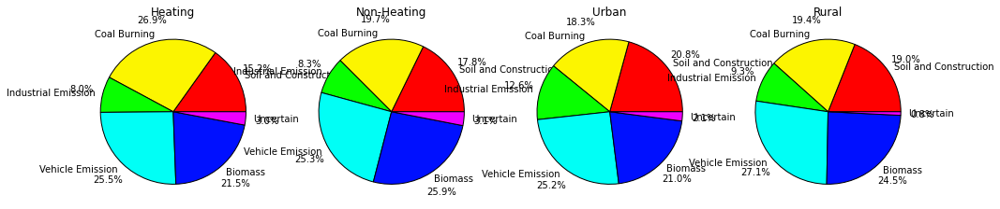

In [36]:
#listofcolors = [plt.cm.Purples(np.linspace(0.2,0.8,6)), plt.cm.Blues(np.linspace(0.2,0.8,6)), plt.cm.Reds(np.linspace(0.2,0.8,6)), plt.cm.Greens(np.linspace(0.2,0.8,6))]
gs = gridspec.GridSpec(1, 4)
plt.figure(figsize = (16, 4))
for ID,samplename in enumerate(['Heating', 'Non-Heating', 'Urban', 'Rural']):
    plt.rcParams['axes.prop_cycle'] = cycler(color= plt.cm.hsv(np.linspace(0,1.0,7)))
    ax = plt.subplot(gs[0, ID])
    wedges = ax.pie(listofdfs[ID], autopct='%1.1f%%', pctdistance = 1.3, labels = listofdfs[ID].index)
    for w in wedges[0]:
        w.set_edgecolor('black')
    ax.set_title(samplename)
plt.savefig('Figures/resultspie.png', dpi = 900)

c:\Users\garre\anaconda3\lib\site-packages\pandas\core\frame.py:4524: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


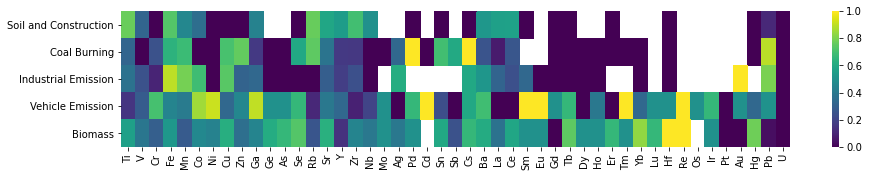

In [37]:
misclassification = pd.DataFrame()
totalmarg = pd.DataFrame()
for i in Sourcekeys:
    df = Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == i]
    df1 = df[df['Probable Source'] != i]
    misclassification = pd.concat([misclassification, marginal_particle(df1[ELEMENTS])], axis = 1)
    totalmarg = pd.concat([totalmarg, marginal_particle(df[ELEMENTS])], axis = 1)
misclassification.columns = Sourcekeys    
totalmarg.columns = Sourcekeys

df = 1 - (misclassification/totalmarg)
#sort the index
df = pd.concat([df.iloc[28:, :], df.iloc[:28, :]])

#transpose
df = df.T

df.columns = [re.sub('[0123456789]', '', i) for i in df.columns]

fig = plt.figure(figsize = (15,2.5))
ax = sns.heatmap(df
#[overalldf
#.sort_values('Value', ascending = False)['index'].unique()[:48]],
,cmap = 'viridis')
plt.savefig('Figures/accuracyheatmap.png', dpi = 600, bbox_inches = "tight")

# Apply model to the mixed source sample

In [78]:
#import the data
DROPELEMENTS = ['56Fe', '24Mg', '25Mg', '27Al']

# Read the csv file and modify columns. Returns a dataframe
#Work on this importing functions. Too many characters in various data formats
def tofread_csv(rawdata, new = True):
    #read csv file.
    data = pd.read_csv(rawdata, error_bad_lines=False)
    #rennaming 1st column as ID
    data = data.rename(index=str, columns={"Unnamed: 0": "ID"})
    #drop columns that have volume and size
    data = data[data.columns.drop(list(data.filter(regex='vol')))]
    data = data[data.columns.drop(list(data.filter(regex='size')))]
    data.columns = data.columns.str.replace('_mass_g','')
    
    if new == False:
    
        data.drop(columns = ['Index', r'timestamp (s)'], inplace = True)
        data.columns = data.columns.str.replace(r' (g', '', regex = False)
        data.columns = data.columns.str.replace(r')', '', regex = False)
        data.columns = data.columns.str.replace(r'[', '', regex = False)
        data.columns = data.columns.str.replace('+', '', regex = False)
        data.columns = data.columns.str.replace(']', '', regex = False)
        
    else:
        data.drop(columns = ['Index', r'timestamp /s'], inplace = True)
        data.columns = data.columns.str.replace(r' /g', '', regex = False)
        data.columns = data.columns.str.replace(r'[', '', regex = False)
        data.columns = data.columns.str.replace('+', '', regex = False)
        data.columns = data.columns.str.replace(']', '', regex = False)
        
    return data

def tofreadcount_csv(rawdata, new = True):
    data = pd.read_csv(rawdata, error_bad_lines=False)
    data = data.rename(index=str, columns={"Unnamed: 0": "ID"})
    data = data[data.columns.drop(list(data.filter(regex='time')))]
    data.drop(columns = ['Index'], inplace = True)
    
    if new == False:
        data.columns = data.columns.str.replace(r" \(cts", '', regex = False)
        data.columns = data.columns.str.replace(r"\)", '', regex = False)
        data.columns = data.columns.str.replace(r'[', '', regex = False)
        data.columns = data.columns.str.replace('+', '', regex = False)
        data.columns = data.columns.str.replace(']', '', regex = False)
    
    else: 
        data.columns = data.columns.str.replace(r" /cts", '', regex = False)
        #data.columns = data.columns.str.replace(r"\)", '', regex = False)
        data.columns = data.columns.str.replace(r'[', '', regex = False)
        data.columns = data.columns.str.replace('+', '', regex = False)
        data.columns = data.columns.str.replace(']', '', regex = False)
    
    return data
    
#non_zero_data drops rows that has a zero value in every isotope returning rows that have particle events. Should be ran first before starting other functions!
def non_zero_data(data):
    #data = data.drop(columns = "ID")
    non_zero_rows = data.abs().sum(axis=1) > 0.0
    non_zero_data = data[non_zero_rows]
    #non_zero_columns = non_zero_data.abs().sum(axis=0) > 0.0
    #non_zero_data = non_zero_data.loc[: , non_zero_columns]
    return non_zero_data

#wrap the tofread function
def wrapper(string,  intensity = False, ELEMENTS = None, new= True):
    df = pd.DataFrame()
    if intensity == True:
        for i in glob.glob(string):
            df = pd.concat([tofreadcount_csv(i, new = new), df], axis = 0, sort = False)
    else:
        for i in glob.glob(string):
            df = pd.concat([tofread_csv(i, new = new), df], axis = 0, sort = False)
    if ELEMENTS != None:
        df.drop(columns = ELEMENTS, inplace = True)
    return non_zero_data(df)


Biomass_1 = wrapper('sample_data/mixedsources/particle_masses_biomassburning**', new = False, ELEMENTS = DROPELEMENTS)
Coalburning_1 = wrapper('sample_data/mixedsources/particle_masses_coalburning**', new = False, ELEMENTS = DROPELEMENTS)
ConstructionSand_1 = wrapper('sample_data/mixedsources/particle_masses_Constructionsand**', new = False, ELEMENTS = DROPELEMENTS)
Constructiondust_1 = wrapper('sample_data/mixedsources/particle_masses_Constructiondust**', new = False, ELEMENTS = DROPELEMENTS)
Soildust_1 = wrapper('sample_data/mixedsources/particle_masses_Soildust**', new = False, ELEMENTS = DROPELEMENTS)
Soilconmix_1 = wrapper('sample_data/mixedsources/particle_masses_soilconmix**', new = False, ELEMENTS = DROPELEMENTS)
Industrialemission_1 = wrapper('sample_data/mixedsources/particle_masses_industrialemission**', new = False, ELEMENTS = DROPELEMENTS)
urbanfugitivedust_1 = wrapper('sample_data/mixedsources/particle_masses_urbanfugitivedust**', new = False, ELEMENTS = DROPELEMENTS)
Sourcemix_1 = wrapper('sample_data/mixedsources/particle_masses_sourcemix**', new = False, ELEMENTS = DROPELEMENTS)


In [79]:
# Make training dataset from sources here

#Get just the elements of interest
Biomass_1 = non_zero_data(Biomass_1[ELEMENTS])
Coalburning_1 = non_zero_data(Coalburning_1[ELEMENTS])
Soilconmix_1 = non_zero_data(Soilconmix_1[ELEMENTS])
Industrialemission_1 = non_zero_data(Industrialemission_1[ELEMENTS])

Sourcesamples = [Biomass_1, Coalburning_1, Soilconmix_1, Industrialemission_1]
Sourcekeys = [ 'Biomass', 'Coal burning', 'Soil and Construction', 'Industrial emission',]

In [80]:
#create a list with same amount of particles for each
Sourcesamplessame = []
for i in Sourcesamples:
    Sourcesamplessame.append(i.sample(np.array([len(i) for i in Sourcesamples]).min(), random_state = 1))

#reset the index
for i in Sourcesamplessame:
    i.reset_index(inplace = True, drop = True)

In [81]:
Sourcetraining = pd.DataFrame()
for ID, source in enumerate(Sourcesamplessame):
    source['labels'] = Sourcekeys[ID]
    Sourcetraining = pd.concat([Sourcetraining, source])

In [82]:
Sourcetraining['elements'] = aggregate_particles_mod(Sourcetraining[ELEMENTS])

In [83]:
#what are the particle/g at these dilutions?

timeacquisition = 540/60 #minutes
flowrate = 0.4 #ml/minute
transportefficiency = 0.0044
dilution = 10**4
masses = [8.7, 12.9, 14.1, 12.6, 14.4, 12.5]
sourcelist = [Biomass_1, Coalburning_1, Soildust_1, ConstructionSand_1, Constructiondust_1, Industrialemission_1]
particleconclist = []

for ID, particleconcentration in enumerate(sourcelist):
    particleconc = len(non_zero_data(particleconcentration[ELEMENTS]))
    particleconclist.append(particleconc*dilution/(timeacquisition*flowrate*transportefficiency)/(masses[ID] * 0.001)
)

particleconclist = np.array(particleconclist)

In [84]:
#INCLUDE THIS IF YOU WANT MULTIELEMENTS
def multielement(df):
    return df[df[df.fillna(0) != 0].count(axis = 1) > 1]

sourcelist = [multielement(Biomass_1), multielement(Coalburning_1), multielement(Soildust_1), multielement(ConstructionSand_1), multielement(Constructiondust_1), multielement(Industrialemission_1)]
particleconclist = []
for ID, particleconcentration in enumerate(sourcelist):
   particleconc = len(non_zero_data(particleconcentration[ELEMENTS]))
   particleconclist.append(particleconc*dilution/(timeacquisition*flowrate*transportefficiency)/(masses[ID] * 0.001)
)

particleconclist = np.array(particleconclist)

In [85]:
#get particle conc / ml

sourcelist_liquid = [Biomass_1, Soilconmix_1, Coalburning_1, Industrialemission_1]
particleconclist_liquid = []

for ID, particleconcentration in enumerate(sourcelist_liquid):
    particleconc = len(non_zero_data(particleconcentration[ELEMENTS]))
    particleconclist_liquid.append(particleconc*dilution/(timeacquisition*flowrate*transportefficiency)/10
)

particleconclist_liquid = np.array(particleconclist_liquid)

#EXPECTED PERCENTAGE
labels_particleconc_liquid = ['Biomass', 'Soil and Construction', 'Coal Burning', 'Industrial Emission']
Expectedpercentage = pd.DataFrame(particleconclist_liquid/particleconclist_liquid.sum(), index = labels_particleconc_liquid).T

In [86]:
#EXPECTED PERCENTAGE
labels_particleconc_liquid = ['Biomass', 'Soil and Construction', 'Coal Burning', 'Industrial Emission']
Expectedpercentage = pd.DataFrame(particleconclist_liquid/particleconclist_liquid.sum(), index = labels_particleconc_liquid).T

In [87]:
#PREDICTED PERCENTAGE
Sourcemix_1 = non_zero_data(Sourcemix_1[ELEMENTS])
# USE THIS IF YOU WANT MULTIELEMENT
#Sourcemix_1 = multielement(Sourcemix_1)
#CONTINUE
Sourcemix_1.reset_index(drop = True, inplace = True)
Sourcemix_1 = Sourcemix_1
Sourcemix_1['elements'] = aggregate_particles_mod(Sourcemix_1[ELEMENTS])
Sourcemix_1['labels'] = 'Sourcemix'

In [88]:
def sourceclustermax_edit(sampledf,  sourcedf, percentage, ELEMENTS):

    totaldf = pd.DataFrame()
    y_scoredf = pd.DataFrame()
    Binarytestlabelsdf = pd.DataFrame()

    train = sourcedf
    test = sampledf

    #get the elements column in dataframe
    for particle in test['elements'].unique():
        trainingdf = train[train['elements'] == particle]
        testingdf = test[test['elements'] == particle]
        model = KNeighborsClassifier(n_neighbors = int(math.ceil(percentage*len(trainingdf))), weights = 'distance')
        Binarymodel = OneVsRestClassifier(model)
        try:
            model.fit(trainingdf[ELEMENTS], trainingdf['labels'])
            testingdf.loc[:,'Probable Source'] = model.predict(testingdf[ELEMENTS])
            testingdf.loc[:,'Confidence'] = model.predict_proba(testingdf[ELEMENTS]).max()

            BinaryTrainlabels = label_binarize(trainingdf['labels'], classes = Sourcekeys)
            BinaryTestlabels = label_binarize(testingdf['labels'], classes = Sourcekeys)
            Binarymodel.fit(trainingdf[ELEMENTS], BinaryTrainlabels)
            

            y_score = Binarymodel.predict_proba(testingdf[ELEMENTS])
            Binarytestlabelsdf = pd.concat([Binarytestlabelsdf, pd.DataFrame(BinaryTestlabels)])
            y_scoredf = pd.concat([y_scoredf, pd.DataFrame(y_score)])
        except:
            testingdf.loc[:,'Probable Source'] = 'Uncertain'

        totaldf = pd.concat([totaldf, testingdf])
        

    return totaldf, y_scoredf, Binarytestlabelsdf

In [89]:

samplefocustotaldf, scoredfsample, Btrain1 = sourceclustermax_edit(Sourcemix_1.fillna(0), Sourcetraining.fillna(0), 0.2, ELEMENTS)

c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
c:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

In [90]:
wraplist = []
Predictedkeys = ['Soil and Construction', 'Coal burning', 'Industrial emission', 'Biomass', 'Uncertain']
for key in Predictedkeys:
    wraplist.append(len(samplefocustotaldf[samplefocustotaldf['Probable Source'] == key])/ len(samplefocustotaldf))

In [91]:
predicteddf = pd.DataFrame(wraplist).T
predicteddf.columns = ['Soil and Construction', 'Coal Burning', 'Industrial Emission', 'Biomass', 'Uncertain']


In [92]:
predicteddf

,Soil and Construction,Coal Burning,Industrial Emission,Biomass,Uncertain
0,0.222798,0.193437,0.410838,0.14076,0.032168


In [93]:
expectpredictdf = pd.concat([predicteddf, Expectedpercentage]).fillna(0)
expectpredictdf.index = ['Predicted', 'Expected']

c:\Users\garre\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


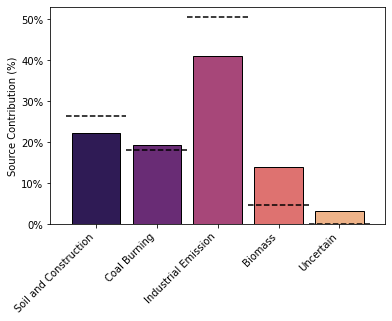

In [94]:

fig, ax = plt.subplots(figsize = (6, 4))
sns.barplot(expectpredictdf.columns, expectpredictdf.loc['Predicted'], edgecolor = 'black', palette = 'magma')
for ID, source in enumerate(expectpredictdf.columns):
    ax.hlines(expectpredictdf.loc['Expected', source], ID - 0.5, ID + 0.5, color = 'black', linestyle = '--')
import matplotlib.ticker as mtick
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.set_ylabel('Source Contribution (%)')
ax.set_xticklabels(expectpredictdf.columns, rotation = 45, ha="right")
plt.savefig('Figures/experimentallymultimixedsample.png',bbox_inches='tight', dpi = 900)

In [205]:
marginal_particle(samplefocustotaldf[samplefocustotaldf['Probable Source'] == 'Biomass'][ELEMENTS])

48Ti     0
169Tm    0
139La    0
140Ce    0
152Sm    0
153Eu    0
158Gd    0
159Tb    0
164Dy    0
165Ho    0
166Er    0
174Yb    0
133Cs    0
175Lu    0
180Hf    0
185Re    0
192Os    0
193Ir    0
195Pt    0
197Au    0
202Hg    0
208Pb    0
138Ba    0
121Sb    0
51V      0
75As     0
53Cr     0
55Mn     0
54Fe     0
59Co     0
60Ni     0
63Cu     0
64Zn     0
69Ga     0
72Ge     0
78Se     0
120Sn    0
85Rb     0
88Sr     0
89Y      0
90Zr     0
93Nb     0
98Mo     0
108Pd    0
107Ag    0
114Cd    0
238U     0
dtype: int64